In [2]:
import random as rnd
import numpy as np
import statistics as stat
import scipy as sc
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import networkx as nx

# Simulación de Cadenas de Markov...
## Procesos Estocásticos 2023-2
## Juan Pablo Rodríguez Villagran

Lo que nos interesaría primero es, dada una matriz de probabilidades de transición, simular trayectorias de ésta, para esto recordemos tal cual que esta matriz está formada por densidades condicionales:
$$(\mathbb{P})_{ij}=P_{ij}=\mathbb{P}[X_n=j|X_{n-1}=i]$$
Además de que la distribución a cada paso, por la Ecuación de Chapman-Kolmogorov, está dada por:
$$\pi^n=\pi^0\mathbb{P}^n=\pi^{n-1}\mathbb{P},\qquad\text{donde}\ \pi^n_j=\mathbb{P}[X_n=j]$$
En todos los ejemplos siguientes, se considera un espacio de estados finito.<br>
La estrategia para _simular_ trayectorias de cadenas de Markov dada una matriz de probabilidades de transición:
1. Definir el espacio de estados,
2. Definir la matriz de probabilidades de transición,
3. Dar una distribución inicial,
4. Con la distribución inicial, obtener un $X_0$,
5. Para obtener $X_1$, generar un número aleatorio siguiendo la densidad del renglón que indique la realización de $X_0$,
6. Repetir para $X_2$ con el resultado de $X_1$ (y seguir...).

Para este ejemplo, consideraremos una cadena de Markov con espacio de estados $\mathbb{E}=\{0,1,2,3,4,5\}$ y matriz de probabilidades de transición
$$\mathbb{P}=\begin{pmatrix}
1 & 0 & 0 & 0 & 0 & 0 \\
\frac{1}{4} & \frac{1}{2} & \frac{1}{4} & 0 & 0 & 0 \\
0 & \frac{1}{5} & \frac{2}{5} & \frac{1}{5} & 0 & \frac{1}{5} \\
0 & 0 & 0 & \frac{1}{6} & \frac{1}{3} & \frac{1}{2} \\
0 & 0 & 0 & \frac{1}{2} & 0 & \frac{1}{2} \\
0 & 0 & 0 & \frac{1}{4} & 0 & \frac{3}{4}
\end{pmatrix}$$
En este caso consideraremos una distribución inicial uniforme en $\mathbb{E}$ pero lo que haremos es lo suficientemente general para que siga siendo útil así cambiemos la matriz (mientras sea cuadrada) y la distribución inicial.

In [3]:
# Definimos la matriz de probas de transición
P = np.array([[1,0,0,0,0,0],
             [1/4,1/2,1/4,0,0,0],
             [0,1/5,2/5,1/5,0,1/5],
             [0,0,0,1/6,1/3,1/2],
             [0,0,0,1/2,0,1/2],
             [0,0,0,1/4,0,3/4]])
#print(P)

# Definimos el espacio de estados
E = np.arange(0,len(P[0]))
#print(E)

# Damos una densidad uniforme
pi0 = len(E)*[1/len(E)]
#print(pi0)

In [4]:
# Sólo por payasada xd, una función para hacer el diagrama de estados
def draw_state_diagram(P, states):
    # Create a directed graph object
    G = nx.DiGraph()

    # Add nodes to the graph
    for i in range(len(states)):
        G.add_node(states[i])

    # Add edges to the graph
    for i in range(len(states)):
        for j in range(len(states)):
            G.add_edge(states[i], states[j], weight=P[i][j])

    # Define the position of each node
    pos = nx.spring_layout(G)

    # Draw the nodes
    nx.draw_networkx_nodes(G, pos, node_color='lightblue', node_size=500)

    # Draw the edges
    nx.draw_networkx_edges(G, pos, width=2, alpha=0.5)

    # Add labels to the nodes
    labels = {}
    for i in range(len(states)):
        labels[states[i]] = states[i]
    nx.draw_networkx_labels(G, pos, labels, font_size=16)

    # Add labels to the edges
    edge_labels = {}
    for i in range(len(states)):
        for j in range(len(states)):
            if P[i][j] > 0:
                edge_labels[(states[i], states[j])] = str(P[i][j])
    nx.draw_networkx_edge_labels(G, pos, edge_labels, font_size=10)

    # Show the diagram
    plt.axis('off')
    plt.show()


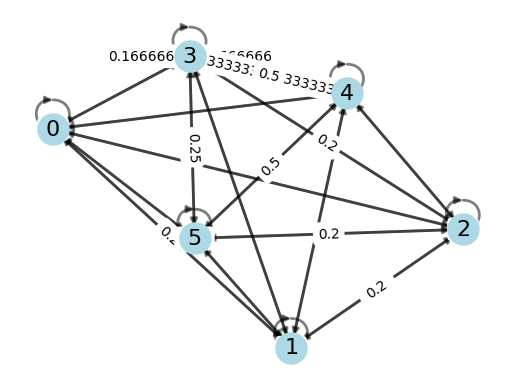

In [5]:
draw_state_diagram(P,E)

In [6]:
# Veamos qué ocurre definiendo X0 y X1
Tray = []

# Se elige un número aleatorio en el espacio de estados usando como densidad de probabilidad la p0 definida
# La función choices de random es choices(posibles valores,densidad,tamaño de la muestra)
X0 = rnd.choices(E,pi0,k=1)
Tray.append(X0[0])

# Generamos otro número aleatorio en el espacio de estados PERO ahora se utiliza la densidad condicional dada X0, por eso se utiliza como densidad
X1 = rnd.choices(E,P[X0[0]],k=1)
Tray.append(X1[0])
print(Tray)

[4, 3]


In [7]:
# Caso general...
# Número de pasos (al final se tienen N+2 pasos...):
N = 50
A = np.arange(N+1)
X0 = rnd.choices(E,pi0,k=1)
Tray = [X0[0]]

for i in A:
    u = rnd.choices(E,P[Tray[i]],k=1)
    Tray.append(u[0])

print(Tray)

[3, 5, 5, 5, 5, 5, 3, 5, 5, 3, 5, 5, 3, 4, 5, 5, 3, 4, 3, 5, 5, 5, 5, 3, 5, 5, 3, 5, 5, 5, 5, 3, 4, 3, 3, 4, 3, 4, 3, 5, 5, 3, 3, 4, 3, 4, 3, 4, 3, 3, 4, 3]


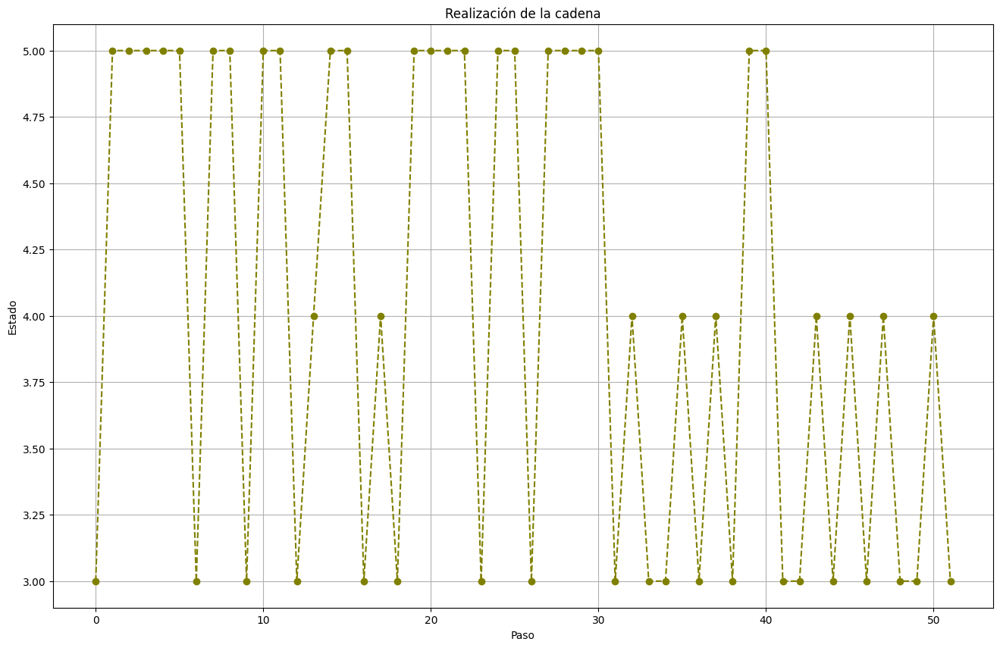

In [8]:
X = range(N+2)
plt.figure(figsize=[16,10])
#plt.plot(X,Pasos,'bo',color='olive')
plt.plot(X,Tray,linestyle='--',marker='o',color='olive')
plt.title('Realización de la cadena')
plt.xlabel('Paso')
plt.ylabel('Estado')
plt.grid('on')
plt.show()

Igual, sólo por curiosidad, podemos estudiar el número de veces que visitó cada estado en nuestra realización:

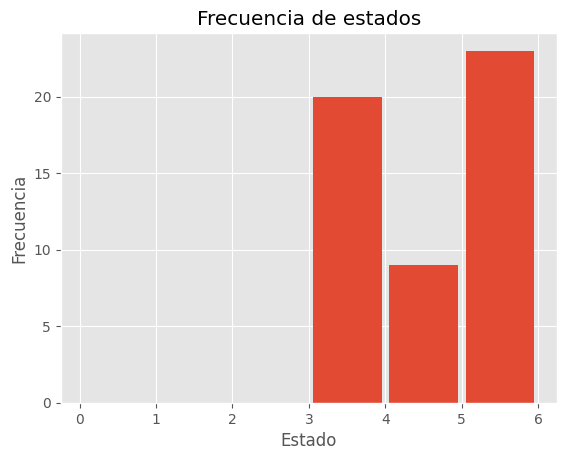

In [15]:
plt.style.use('ggplot')
plt.title('Frecuencia de estados')
plt.xlabel('Estado')
plt.ylabel('Frecuencia')
plt.hist(Tray,bins=[0,1,2,3,4,5,6],rwidth = 0.9)
plt.show()

Si revisamos la matriz de conectividad de la cadena que tenemos:
$$\mathbb{P}=\begin{pmatrix}
1 & 0 & 0 & 0 & 0 & 0 \\
\frac{1}{4} & \frac{1}{2} & \frac{1}{4} & 0 & 0 & 0 \\
0 & \frac{1}{5} & \frac{2}{5} & \frac{1}{5} & 0 & \frac{1}{5} \\
0 & 0 & 0 & \frac{1}{6} & \frac{1}{3} & \frac{1}{2} \\
0 & 0 & 0 & \frac{1}{2} & 0 & \frac{1}{2} \\
0 & 0 & 0 & \frac{1}{4} & 0 & \frac{3}{4}
\end{pmatrix}\implies g=\begin{pmatrix}
1 & 0 & 0 & 0 & 0 & 0 \\
1 & 1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 & 1 \\
0 & 0 & 0 & 1 & 1 & 1 \\
0 & 0 & 0 & 1 & 1 & 1 \\
0 & 0 & 0 & 1 & 1 & 1
\end{pmatrix}$$
Así tenemos tres clases de comunicación, de las cuales dos son cerradas:
$$c(0)=\{0\}\ \text{cerrada,}\quad c(1)=\{1,2\}\ \text{no cerrada,}\quad c(3)=\{3,4,5\}\ \text{cerrada}$$
Podemos notar que efectivamente hay un momento en el que la cadena sólo toma valores en $c(0)$ o $c(3)$.<br>
Es más interesante cuando la cadena es irreducible.

## Ejemplo más interesante...
Por análisis estadísticos de transición entre notas musicales, cada tipo de música puede codificarse en una cadena de Markov. Consideremos la siguiente matriz de probabilidades de transición:
$$\mathbb{P}=\begin{pmatrix}
4/19 & 0 & 3/19 & 0 & 2/19 & 1/19 & 0 & 6/19 & 3/19 \\
1 & 0 & 0 & 0 & 0 & 0 & 0 & 0 & 0 \\
7/15 & 0 & 1/15 & 4/15 & 0 & 3/15 & 0 & 0 & 0 \\
0 & 0 & 6/15 & 3/15 & 6/15 & 0 & 0 & 0 & 0 \\
0 & 0 & 0 & 3/11 & 3/11 & 5/11 & 0 & 0 & 0 \\
4/19 & 1/19 & 0 & 3/19 & 0 & 5/19 & 4/19 & 1/19 & 1/19 \\
0 & 0 & 0 & 1/5 & 0 & 0 & 1/5 & 0 & 3/5 \\
1/5 & 0 & 1/5 & 2/5 & 0 & 0 & 0 & 1/5 & 0 \\
0 & 0 & 3/4 & 0 & 0 & 1/4 & 0 & 0 & 0
\end{pmatrix}$$
El espacio de estados considerado es $\mathbb{E}=\{A,A\#,B,C,D,E,F,G,G\#\}$, dicha matriz se obtuvo de dicho análisis a la canción del siguiente link<br>
https://www.youtube.com/watch?v=5rf9GNre158<br>
(por si no lo pude abrir..., es la de estrellita dónde estás jajaja)<br>
Si alguien tiene duda sobre el algoritmo, básicamente se enlistan las notas en orden de aparición y se cuenta cuántas veces aparece $x$ nota después de $y$ nota y todo eso se pone en una matriz, por ejemplo para el inicio del "Feliz Cumpleaños" gringo se tiene la secuencia:
$$CCDCFECCDCGFCC\implies\begin{cases}
C\to C & 3\ \text{veces}\\
C\to D & 2\ \text{veces}\\
D\to C & 2\ \text{veces}\\
C\to F & 1\ \text{vez}\\
F\to E & 1\ \text{vez}\\
E\to C & 1\ \text{vez}\\
C\to G & 1\ \text{vez}\\
G\to F & 1\ \text{vez}\\
F\to C & 1\ \text{vez}
\end{cases}\implies\mathbb{P}=\begin{pmatrix}
0 & 0 & 0 & 0 & 0 & 0 & 0 \\
0 & 0 & 0 & 0 & 0 & 0 & 0 \\
0 & 0 & 3/7 & 2/7 & 0 & 1/7 & 1/7 \\
0 & 0 & 1 & 0 & 0 & 0 & 0 \\
0 & 0 & 1 & 0 & 0 & 0 & 0 \\
0 & 0 & 1/2 & 0 & 1/2 & 0 & 0 \\
0 & 0 & 0 & 0 & 0 & 1 & 0
\end{pmatrix}\propto\begin{pmatrix}
0 & 0 & 0 & 0 & 0 & 0 & 0 \\
0 & 0 & 0 & 0 & 0 & 0 & 0 \\
0 & 0 & 3 & 2 & 0 & 1 & 1 \\
0 & 0 & 1 & 0 & 0 & 0 & 0 \\
0 & 0 & 1 & 0 & 0 & 0 & 0 \\
0 & 0 & 1 & 0 & 1 & 0 & 0 \\
0 & 0 & 0 & 0 & 0 & 1 & 0
\end{pmatrix}$$
Con espacio de estados $\mathbb{E}=\{A,B,C,D,E,F,G\}$.

Entonces, simulemos una trayectoria de la cadena obtenida de la Estrellita, siguiendo exactamente el mismo procedimiento, haciendo la identificación de cada nota con un número.

In [16]:
# Definimos la matriz de probas de transición
P2 = np.array([[4/19,0,3/19,0,2/19,1/19,0,6/19,3/19],
               [1,0,0,0,0,0,0,0,0],
               [7/15,0,1/15,4/15,0,3/15,0,0,0],
               [0,0,6/15,3/15,6/15,0,0,0,0],
               [0,0,0,3/11,3/11,5/11,0,0,0],
               [4/19,1/19,0,3/19,0,5/19,4/19,1/19,1/19],
               [0,0,0,1/5,0,0,1/5,0,3/5],
               [1/5,0,1/5,2/5,0,0,0,1/5,0],
               [0,0,3/4,0,0,1/4,0,0,0],])
#print(P2)

# Definimos el espacio de estados
E2 = np.arange(0,len(P2[0]))
Chrd = ['A','AH','B','C','D','E','F','G','GH']
#print(E2)

# Damos una densidad uniforme
pi20 = len(E2)*[1/len(E2)]
#print(pi20)

In [17]:
# Caso general...
# Número de pasos (al final se tienen N+2 pasos...):
N2 = 50
A2 = np.arange(N2+1)
Y0 = rnd.choices(E2,pi20,k=1)
Song = [Y0[0]]

for i in A2:
    u = rnd.choices(E2,P2[Song[i]],k=1)
    Song.append(u[0])

print(Song)

[8, 5, 7, 2, 0, 4, 3, 2, 5, 6, 6, 6, 8, 2, 5, 8, 2, 3, 4, 5, 0, 5, 6, 8, 5, 5, 6, 3, 2, 0, 0, 7, 7, 2, 0, 7, 3, 4, 3, 2, 3, 2, 3, 2, 0, 5, 6, 6, 8, 2, 5, 3]


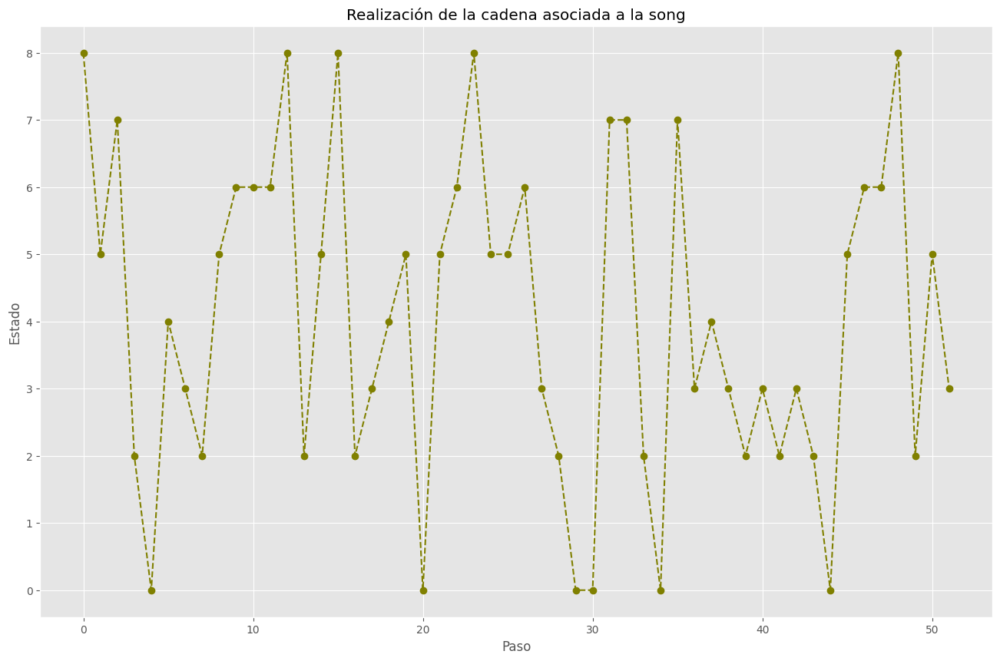

In [18]:
Y = range(N2+2)
plt.figure(figsize=[16,10])
#plt.plot(X,Pasos,'bo',color='olive')
plt.plot(Y,Song,linestyle='--',marker='o',color='olive')
plt.title('Realización de la cadena asociada a la song')
plt.xlabel('Paso')
plt.ylabel('Estado')
plt.grid('on')
plt.show()

In [19]:
Notas = []
for x in Song:
    u = np.where(E2 == x)
    Notas.append(Chrd[int(u[0])])
#'AH' in Notas

En principio la lista que ya tenemos podría tocarse y ver qué pasa... Namás por payasada, generemos un archivo de audio de lo que acabamos de hacer (todas las notas tendrán la misma duración por practicidad, pero se puede modificar...)

In [20]:
from scipy.io import wavfile
from IPython.display import Audio
from scipy.io.wavfile import read

In [21]:
# Esta parte más artesanal, empecé tarde y no lo optimicé mucho je
A = read('a3.wav')[1]
AH = read('a3h.wav')[1]
B = read('b3.wav')[1]
C = read('c4.wav')[1]
D = read('d4.wav')[1]
E = read('e4.wav')[1]
F = read('f4.wav')[1]
G = read('g4.wav')[1]
GH = read('g4h.wav')[1]

In [22]:
# Ahora sí traducimos la cosa generada a sonidos...
# Perdonen el aberrante elif gigante :v
Sonidos = []
for x in Notas:
    if x == 'A':
        Sonidos.append(A)
    elif x == 'AH':
        Sonidos.append(AH)
    elif x == 'B':
        Sonidos.append(B)
    elif x == 'C':
        Sonidos.append(C)
    elif x == 'D':
        Sonidos.append(D)
    elif x == 'E':
        Sonidos.append(E)
    elif x == 'F':
        Sonidos.append(F)
    elif x == 'G':
        Sonidos.append(G)
    elif x == 'GH':
        Sonidos.append(GH)

In [23]:
UwU = np.concatenate([A,AH,B,C,D,E,F,G,GH])
wavfile.write('pruebasuma.wav',20000,UwU)
Audio('pruebasuma.wav')

In [24]:
Musica = np.concatenate(Sonidos)
wavfile.write('randomsong.wav',20000,Musica)
Audio('randomsong.wav')

In [26]:
# Versión al triple de velocidad xd
Audio('randomsong3x.wav')

Las frecuencias que utilicé...
- A3 - 220Hz
- A3# - 233.08Hz
- B3 - 246.94Hz
- C4 - 261.63Hz
- D4 - 293.66Hz
- E4 - 329.63Hz
- F4 - 349.23Hz
- G4 - 392Hz
- G4# - 415.30Hz

Pero ya, mucha diversión jajaja. Lo otro que les interesa...<br>
En el transcurso del tema trabajamos con otras tantas variables aleatorias, todas en función de la cadena, algunas de ellas fueron:
- $T_i=\min\{n\geq0\ |\ X_n=i\}$ el tiempo de primera visita,
- $N_j^n=\sum_{m=1}^n1_j(X_m)$ el número de visitas.

Teniendo una realización de la cadena, como las que ya simulamos, podemos calcular también valores para estas variables aleatorias.<br>
**Como ambas son función de la cadena, para simularlas necesitamos ya tener una cadena simulada**.<br>
Ambas se pueden calcular con su algoritmo de búsqueda favorito. Siguiendo con la cadena *Songs* que generamos 

In [27]:
# Para los tiempos de primera visita
for e in E2:
    if e not in Song:
        print('No se visitó el estado', e)
    else:
        for y in Song:
            if e == y:
                print('El estado', e, 'se visita por primera vez en', Song.index(y))
                break

El estado 0 se visita por primera vez en 4
No se visitó el estado 1
El estado 2 se visita por primera vez en 3
El estado 3 se visita por primera vez en 6
El estado 4 se visita por primera vez en 5
El estado 5 se visita por primera vez en 1
El estado 6 se visita por primera vez en 9
El estado 7 se visita por primera vez en 2
El estado 8 se visita por primera vez en 0


In [28]:
# Para el número de visitas, podemos definir un proceso de conteo, por ejemplo, para el estado 3
Apar3 = []
for x in Song:
    if x == 3:
        Apar3.append(1)
    else:
        Apar3.append(0)
#Apar3
N3 = np.cumsum(Apar3)
N3

array([0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7,
       7, 7, 7, 7, 7, 7, 7, 8])

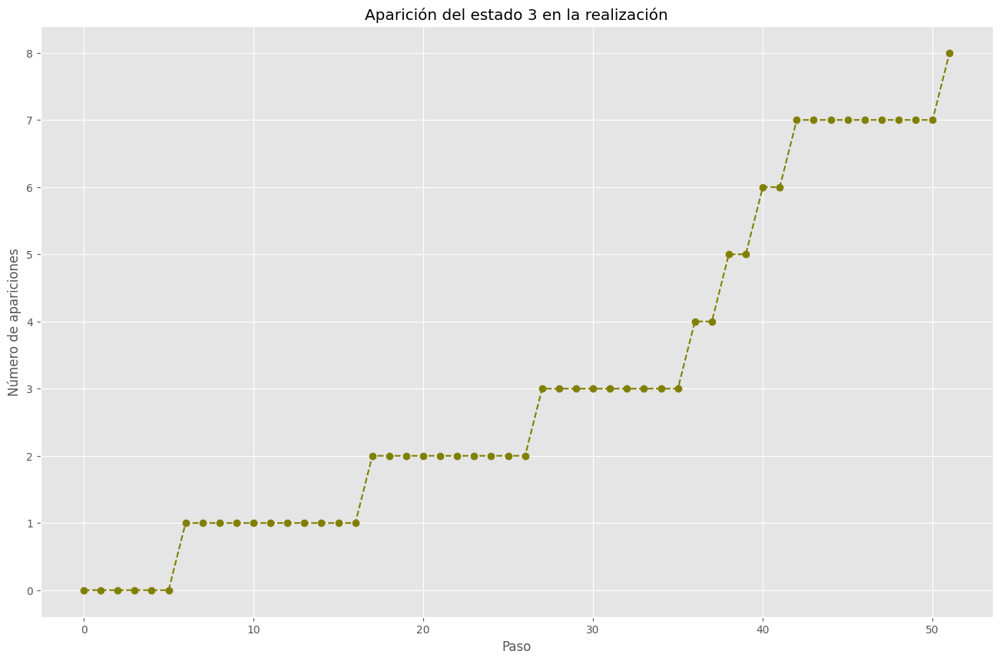

In [29]:
Y = range(N2+2)
plt.figure(figsize=[16,10])
#plt.plot(X,Pasos,'bo',color='olive')
plt.plot(Y,N3,linestyle='--',marker='o',color='olive')
plt.title('Aparición del estado 3 en la realización')
plt.xlabel('Paso')
plt.ylabel('Número de apariciones')
plt.grid('on')
plt.show()